# TradeIn

- **Task1: Let's scrape the given link, see what are the hyperlinks**

- **Task2: From the extracted link, try to get the data of Net capital amount(Bop, current US$)**

# Task 1

In [1650]:
# Import packages
import requests
from bs4 import BeautifulSoup

In [1651]:
# Specify url: url
url = 'https://datahelpdesk.worldbank.org/knowledgebase/articles/898581-api-basic-call-structures'

In [1652]:
# Package the request, send the request and catch the response: r
r = requests.get(url)

In [1653]:
# Extracts the response as html: html_doc
html = r.text

In [1654]:
# Create a BeautifulSoup object from the HTML: soup
soup = BeautifulSoup(html)
# print(soup)

In [1655]:
# # Prettify the BeautifulSoup object: pretty_soup
# pretty_soup = soup.prettify()
# # Print the response
# print(pretty_soup)

In [1656]:
# Find all 'a' tags (which define hyperlinks): a_tags
a_tags = soup.find_all('a')

# Print the URLs to the shell
for link in a_tags:
    print(link.get('href'))

http://www.worldbank.org
http://www.worldbank.org/
http://www.bancomundial.org/
http://www.banquemondiale.org/
http://www.albankaldawli.org/
http://www.worldbank.org/eca/russian/
http://www.worldbank.org.cn/Chinese/
http://www.worldbank.org/languages
http://www.worldbank.org/
http://www.worldbank.org/en/about
http://data.worldbank.org/
http://econ.worldbank.org/WBSITE/EXTERNAL/EXTDEC/0,,menuPK:476823~pagePK:64165236~piPK:64165141~theSitePK:469372,00.html
http://wbi.worldbank.org/wbi/
http://www.worldbank.org/en/news
http://www.worldbank.org/projects?lang=en
http://www.worldbank.org/reference/
http://www.worldbank.org/en/country
http://www.worldbank.org/en/topic
http://data.worldbank.org
/knowledgebase/topics/125589-developer-information
http://api.worldbank.org/V2/country?incomeLevel=LIC
http://api.worldbank.org/V2/incomeLevel/LIC/country
http://api.worldbank.org/v2/country/all/indicator/SP.POP.TOTL?date=2000
http://api.worldbank.org/v2/country/chn;bra/indicator/DPANUSSPB?date=2012M01


## Get the Data

In [1657]:
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [1658]:
# url = 'http://api.worldbank.org/v2/country/all/indicator/BN.FIN.TOTL.CD?format=json&date=2010:2020'

In [1659]:
url = 'http://api.worldbank.org/v2/country/all/indicator/BN.TRF.KOGT.CD?format=json&date=2001:2020'

In [1660]:
r = requests.get(url)
json_data = r.json()

In [1661]:
json_data

[{'page': 1,
  'pages': 107,
  'per_page': 50,
  'total': 5320,
  'sourceid': '2',
  'sourcename': 'World Development Indicators',
  'lastupdated': '2022-02-15'},
 [{'indicator': {'id': 'BN.TRF.KOGT.CD',
    'value': 'Net capital account (BoP, current US$)'},
   'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'},
   'countryiso3code': 'AFE',
   'date': '2020',
   'value': None,
   'unit': '',
   'obs_status': '',
   'decimal': 0},
  {'indicator': {'id': 'BN.TRF.KOGT.CD',
    'value': 'Net capital account (BoP, current US$)'},
   'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'},
   'countryiso3code': 'AFE',
   'date': '2019',
   'value': None,
   'unit': '',
   'obs_status': '',
   'decimal': 0},
  {'indicator': {'id': 'BN.TRF.KOGT.CD',
    'value': 'Net capital account (BoP, current US$)'},
   'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'},
   'countryiso3code': 'AFE',
   'date': '2018',
   'value': None,
   'unit': '',
   'obs_status': '',


In [1662]:
# pd.DataFrame(json_data[1])

In [1663]:
pd.DataFrame([{'indicator_id':1233, 'country_id': 'AH', 'country_value': 'Net financial account (BoP, current US$)', 'countryiso3code':'AFE'}])

,indicator_id,country_id,country_value,countryiso3code
0,1233,AH,"Net financial account (BoP, current US$)",AFE


In [1504]:
# r.json()[1]


In [1506]:
result = []
for i in range(1, 108):
    url = f'http://api.worldbank.org/v2/country/all/indicator/BN.TRF.KOGT.CD?format=json&date=2001:2020&page={i}'
    r = requests.get(url)
    data = r.json()[1]
    for j in data:
        a = {'indicator_id':j.get("indicator").get("id"),
             'indicator_value':j.get("indicator").get("value"),
             'country_id': j.get("country").get("id"),
             'country_value': j.get("country").get("value"),
             'countryiso3code':j.get("countryiso3code"),
             'date': j.get("date"),
             'value': j.get("value"),
             'unit':j.get("unit"),
             'obs_status':j.get("obs_status"),
             'decimal':j.get("decimal")}
        result.append(a)

In [1664]:
df = pd.DataFrame(result)

In [1665]:
df[-10:-1]

,indicator_id,indicator_value,country_id,country_value,countryiso3code,date,value,unit,obs_status,decimal
5310,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2010,231000000.0,,,0
5311,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2009,391000000.0,,,0
5312,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2008,NaN,,,0
5313,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2007,NaN,,,0
5314,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2006,NaN,,,0
5315,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2005,NaN,,,0
5316,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2004,NaN,,,0
5317,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2003,NaN,,,0
5318,BN.TRF.KOGT.CD,"Net capital account (BoP, current US$)",ZW,Zimbabwe,ZWE,2002,NaN,,,0


In [1666]:
df.shape

(5320, 10)

In [1667]:
df.value.sum()

545468862178.399

In [1668]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5320 entries, 0 to 5319
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   indicator_id     5320 non-null   object 
 1   indicator_value  5320 non-null   object 
 2   country_id       5320 non-null   object 
 3   country_value    5320 non-null   object 
 4   countryiso3code  5320 non-null   object 
 5   date             5320 non-null   object 
 6   value            3104 non-null   float64
 7   unit             5320 non-null   object 
 8   obs_status       5320 non-null   object 
 9   decimal          5320 non-null   int64  
dtypes: float64(1), int64(1), object(8)
memory usage: 415.8+ KB


In [1669]:
df[(df['country_value'] =='Afghanistan')&(df['date']=='2020')]['value']

980    7.531195e+08
Name: value, dtype: float64

## changing the dtypes into more natural form, like,
- date into date type
- value are in exponent form, so changing it to numerical value


In [1670]:
print(df['unit'].value_counts())
print(df['obs_status'].value_counts())
print(df['decimal'].value_counts())

    5320
Name: unit, dtype: int64
    5320
Name: obs_status, dtype: int64
0    5320
Name: decimal, dtype: int64


In [1671]:
df['value'] = df['value'].astype('float')
df['date'] = pd.to_datetime(df['date'])
# df['date'] = df['date'].astype('int')


# recover the Net capital account values for all countries,

## Cleaned Dataset

In [1672]:
column_to_keep = ['country_id','countryiso3code','country_value','date', 'value']

In [1673]:
# new_df = df.drop(columns=['unit', 'obs_status', 'decimal'])
new_df = df[column_to_keep]
new_df

,country_id,countryiso3code,country_value,date,value
0,ZH,AFE,Africa Eastern and Southern,2020-01-01,NaN
1,ZH,AFE,Africa Eastern and Southern,2019-01-01,NaN
2,ZH,AFE,Africa Eastern and Southern,2018-01-01,NaN
3,ZH,AFE,Africa Eastern and Southern,2017-01-01,NaN
4,ZH,AFE,Africa Eastern and Southern,2016-01-01,NaN
...,...,...,...,...,...
5315,ZW,ZWE,Zimbabwe,2005-01-01,NaN
5316,ZW,ZWE,Zimbabwe,2004-01-01,NaN
5317,ZW,ZWE,Zimbabwe,2003-01-01,NaN
5318,ZW,ZWE,Zimbabwe,2002-01-01,NaN


## Exploring dataset

In [1674]:
new_df.isnull().sum()

country_id            0
countryiso3code       0
country_value         0
date                  0
value              2216
dtype: int64

In [1675]:
new_df.shape

(5320, 5)

**The 20 year data from year 2001 to 2020 has 2926 rows of data.**
- We have 2216 null values in the Net 

# give an estimate on the Net capital account for countries where the information is missing,

In [1676]:
filtered_df = new_df[new_df['value'].isnull()]
filtered_df.shape

(2216, 5)

In [1677]:
filtered_df.sort_values(by=['country_value', 'date'])

,country_id,countryiso3code,country_value,date,value
999,AF,AFG,Afghanistan,2001-01-01,NaN
998,AF,AFG,Afghanistan,2002-01-01,NaN
997,AF,AFG,Afghanistan,2003-01-01,NaN
996,AF,AFG,Afghanistan,2004-01-01,NaN
995,AF,AFG,Afghanistan,2005-01-01,NaN
...,...,...,...,...,...
5316,ZW,ZWE,Zimbabwe,2004-01-01,NaN
5315,ZW,ZWE,Zimbabwe,2005-01-01,NaN
5314,ZW,ZWE,Zimbabwe,2006-01-01,NaN
5313,ZW,ZWE,Zimbabwe,2007-01-01,NaN


In [1678]:
# new_df[new_df['country_value']=='Africa Eastern and Southern']

In [1679]:
new_df['country_value'].nunique() - filtered_df['country_value'].nunique()

87

In [1680]:
empty_BoP_for_10years = filtered_df['country_value'].value_counts().reset_index(name='blank_years')
empty_BoP_for_10years = empty_BoP_for_10years.rename(columns={'index':'country'})
empty_BoP_for_10years

,country,blank_years
0,Africa Eastern and Southern,20
1,American Samoa,20
2,San Marino,20
3,Singapore,20
4,"Bahamas, The",20
...,...,...
174,Guinea,1
175,Panama,1
176,South Africa,1
177,Ghana,1


**Significant Meaning: The above table shows that, African Eastern and Southern(eg from row 1) has empty value from year 2011 to 2020, so our startegy of imputing missing values will be failed.**   
     
**In order to, make this correct, we will remove any countries that has more than 6 years of empty value.**

### Check only those country which have more than 5 years of blank data from year 2011 to 2020
- strategy : average imputation of data can be done. 


In [1681]:
new_df.shape

(5320, 5)

In [1682]:
# empty_BoP_for_10years[empty_BoP_for_10years['blank_years']==10]['country'].to_list()

In [1683]:
# year 2016 - 2020
list_of_country_to_remove = empty_BoP_for_10years[empty_BoP_for_10years['blank_years']>=14]['country'].to_list()
list_of_country_to_remove

['Africa Eastern and Southern',
 'American Samoa',
 'San Marino',
 'Singapore',
 'Bahamas, The',
 'Somalia',
 'St. Martin (French part)',
 'Turkmenistan',
 'United Arab Emirates',
 'Vietnam',
 'Northern Mariana Islands',
 'Virgin Islands (U.S.)',
 'World',
 'Upper middle income',
 'Sub-Saharan Africa (IDA & IBRD countries)',
 'Sub-Saharan Africa (excluding high income)',
 'Sub-Saharan Africa',
 'South Asia (IDA & IBRD)',
 'Puerto Rico',
 'Monaco',
 'Cuba',
 'Central African Republic',
 'Eritrea',
 'Africa Western and Central',
 'Colombia',
 'Faroe Islands',
 'Gibraltar',
 'Channel Islands',
 'Chad',
 'Greenland',
 'Bermuda',
 'Guam',
 'Iran, Islamic Rep.',
 'Isle of Man',
 'British Virgin Islands',
 "Korea, Dem. People's Rep.",
 'Libya',
 'Liechtenstein',
 'South Asia',
 'Small states',
 'Pre-demographic dividend',
 'Post-demographic dividend',
 'IDA blend',
 'IDA & IBRD total',
 'IBRD only',
 'High income',
 'Heavily indebted poor countries (HIPC)',
 'Fragile and conflict affected sit

In [1684]:
len(list_of_country_to_remove)

92

In [1685]:
new_df.shape

(5320, 5)

In [1686]:
for i in range(len(list_of_country_to_remove)):
#     print(list_of_country_to_remove[i])
#     cleaned = new_df.copy()
#     cleaned.drop(cleaned[cleaned['country_value'] == list_of_country_to_remove[i]].index, inplace=True)
    new_df.drop(new_df[new_df['country_value'] == list_of_country_to_remove[i]].index, inplace=True)

In [1687]:
new_df.shape

(3480, 5)

In [1688]:
new_df.value.isnull().sum()

422

In [1689]:
cleaned = new_df.copy()
cleaned.value.sum()

523909487596.18604

In [1690]:
cleaned['value'] = cleaned['value'].astype('float')
cleaned

,country_id,countryiso3code,country_value,date,value
180,XC,EMU,Euro area,2020-01-01,-1.858497e+09
181,XC,EMU,Euro area,2019-01-01,-2.948600e+10
182,XC,EMU,Euro area,2018-01-01,-4.026114e+10
183,XC,EMU,Euro area,2017-01-01,-2.171618e+10
184,XC,EMU,Euro area,2016-01-01,1.641000e+09
...,...,...,...,...,...
5315,ZW,ZWE,Zimbabwe,2005-01-01,NaN
5316,ZW,ZWE,Zimbabwe,2004-01-01,NaN
5317,ZW,ZWE,Zimbabwe,2003-01-01,NaN
5318,ZW,ZWE,Zimbabwe,2002-01-01,NaN


## Now, Let's impute the values for these country

In [1691]:
# year 2011 - 2015
country_to_impute = empty_BoP_for_10years[empty_BoP_for_10years['blank_years']<6]['country'].to_list()
country_to_impute

['Uruguay',
 'Kiribati',
 'Timor-Leste',
 'Mexico',
 'Malaysia',
 'Bhutan',
 'Burkina Faso',
 'New Caledonia',
 "Cote d'Ivoire",
 'Guatemala',
 'Burundi',
 'Austria',
 'Barbados',
 'Mozambique',
 'Indonesia',
 'Iraq',
 'Ireland',
 'Aruba',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 'Egypt, Arab Rep.',
 'Algeria',
 'Comoros',
 'Sudan',
 'Eswatini',
 'Azerbaijan',
 'Gambia, The',
 'Samoa',
 'Kosovo',
 'Senegal',
 'Bahrain',
 'Chile',
 'Malawi',
 'China',
 'Tajikistan',
 'Mali',
 'Jordan',
 'Cyprus',
 'Dominican Republic',
 'Luxembourg',
 'Macao SAR, China',
 'Tuvalu',
 'Angola',
 'Kenya',
 'Togo',
 'Benin',
 'Sierra Leone',
 'Nepal',
 'Guinea-Bissau',
 'Belgium',
 'Pakistan',
 'Guinea',
 'Panama',
 'South Africa',
 'Ghana',
 'Lebanon']

In [1692]:
len(empty_BoP_for_10years[empty_BoP_for_10years['blank_years']<5]['country'].to_list())

47

### Impute value with mean strategy

In [1693]:
len(cleaned.groupby('country_value')['value'].mean().astype('float'))

174

In [1694]:
cleaned[cleaned['value'].isnull()]

,country_id,countryiso3code,country_value,date,value
993,AF,AFG,Afghanistan,2007-01-01,NaN
994,AF,AFG,Afghanistan,2006-01-01,NaN
995,AF,AFG,Afghanistan,2005-01-01,NaN
996,AF,AFG,Afghanistan,2004-01-01,NaN
997,AF,AFG,Afghanistan,2003-01-01,NaN
...,...,...,...,...,...
5315,ZW,ZWE,Zimbabwe,2005-01-01,NaN
5316,ZW,ZWE,Zimbabwe,2004-01-01,NaN
5317,ZW,ZWE,Zimbabwe,2003-01-01,NaN
5318,ZW,ZWE,Zimbabwe,2002-01-01,NaN


In [1695]:
print(cleaned[cleaned['country_value']=='Aruba']['value'].mean())
print(cleaned[cleaned['country_value']=='Uruguay']['value'].mean())

24884231.67825391
11533613.515955538


In [1696]:
cleaned[cleaned['country_value']=='Aruba']

,country_id,countryiso3code,country_value,date,value
1160,AW,ABW,Aruba,2020-01-01,1.220275e+07
1161,AW,ABW,Aruba,2019-01-01,1.524499e+06
1162,AW,ABW,Aruba,2018-01-01,-9.878742e+04
1163,AW,ABW,Aruba,2017-01-01,NaN
1164,AW,ABW,Aruba,2016-01-01,NaN
1165,AW,ABW,Aruba,2015-01-01,-4.656613e-10
1166,AW,ABW,Aruba,2014-01-01,NaN
1167,AW,ABW,Aruba,2013-01-01,NaN
1168,AW,ABW,Aruba,2012-01-01,4.656613e-10
1169,AW,ABW,Aruba,2011-01-01,-1.164153e-10


In [1697]:
cleaned[cleaned['country_value']=='Uruguay']

,country_id,countryiso3code,country_value,date,value
5120,UY,URY,Uruguay,2020-01-01,6.858008e+07
5121,UY,URY,Uruguay,2019-01-01,-3.753178e+08
5122,UY,URY,Uruguay,2018-01-01,4.565384e+07
5123,UY,URY,Uruguay,2017-01-01,1.960800e+07
5124,UY,URY,Uruguay,2016-01-01,4.993415e+07
5125,UY,URY,Uruguay,2015-01-01,1.250326e+08
5126,UY,URY,Uruguay,2014-01-01,6.671510e+07
5127,UY,URY,Uruguay,2013-01-01,2.903601e+07
5128,UY,URY,Uruguay,2012-01-01,1.198362e+08
5129,UY,URY,Uruguay,2011-01-01,NaN


# compute the uncertainty on your estimation when the value is missing

In [1698]:
cleaned['value'] = cleaned['value'].fillna(cleaned.groupby('country_value')['value'].transform('mean'))

In [1699]:
cleaned.isnull().sum()

country_id         0
countryiso3code    0
country_value      0
date               0
value              0
dtype: int64

In [1700]:
# Test Case : Aruba, Uzbekistan
cleaned[cleaned['country_value']=='Aruba']

,country_id,countryiso3code,country_value,date,value
1160,AW,ABW,Aruba,2020-01-01,1.220275e+07
1161,AW,ABW,Aruba,2019-01-01,1.524499e+06
1162,AW,ABW,Aruba,2018-01-01,-9.878742e+04
1163,AW,ABW,Aruba,2017-01-01,2.488423e+07
1164,AW,ABW,Aruba,2016-01-01,2.488423e+07
1165,AW,ABW,Aruba,2015-01-01,-4.656613e-10
1166,AW,ABW,Aruba,2014-01-01,2.488423e+07
1167,AW,ABW,Aruba,2013-01-01,2.488423e+07
1168,AW,ABW,Aruba,2012-01-01,4.656613e-10
1169,AW,ABW,Aruba,2011-01-01,-1.164153e-10


In [1701]:
cleaned[cleaned['country_value']=='Uruguay']

,country_id,countryiso3code,country_value,date,value
5120,UY,URY,Uruguay,2020-01-01,6.858008e+07
5121,UY,URY,Uruguay,2019-01-01,-3.753178e+08
5122,UY,URY,Uruguay,2018-01-01,4.565384e+07
5123,UY,URY,Uruguay,2017-01-01,1.960800e+07
5124,UY,URY,Uruguay,2016-01-01,4.993415e+07
5125,UY,URY,Uruguay,2015-01-01,1.250326e+08
5126,UY,URY,Uruguay,2014-01-01,6.671510e+07
5127,UY,URY,Uruguay,2013-01-01,2.903601e+07
5128,UY,URY,Uruguay,2012-01-01,1.198362e+08
5129,UY,URY,Uruguay,2011-01-01,1.153361e+07


In [1702]:
cleaned.shape

(3480, 5)

# obtain and estimate when possible the Net capital account for the last 10 years in all countries

In [1703]:
cleaned_10_years = cleaned[cleaned['date']>'2010-01-01']
cleaned_10_years

,country_id,countryiso3code,country_value,date,value
180,XC,EMU,Euro area,2020-01-01,-1.858497e+09
181,XC,EMU,Euro area,2019-01-01,-2.948600e+10
182,XC,EMU,Euro area,2018-01-01,-4.026114e+10
183,XC,EMU,Euro area,2017-01-01,-2.171618e+10
184,XC,EMU,Euro area,2016-01-01,1.641000e+09
...,...,...,...,...,...
5305,ZW,ZWE,Zimbabwe,2015-01-01,3.984000e+08
5306,ZW,ZWE,Zimbabwe,2014-01-01,3.694000e+08
5307,ZW,ZWE,Zimbabwe,2013-01-01,2.510000e+08
5308,ZW,ZWE,Zimbabwe,2012-01-01,7.375000e+08


In [1704]:
# Pivoting
# cleaned['BoP'] = cleaned['BoP'].astype('float')
# cleaned = cleaned.drop(columns='BoP')
# cleaned
# cleaned['date'] = pd.to_datetime(cleaned['date'])
# cleaned_10_years.to_csv('BOP_20_years.csv')

In [1705]:
pivot = cleaned.pivot(index='date', columns='country_value', values='value')


In [1706]:
pivot2 = cleaned_10_years.pivot(index='date', columns='country_value', values='value')
pivot2

country_value,Afghanistan,Albania,Algeria,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,Austria,...,Tuvalu,Uganda,Ukraine,United Kingdom,United States,Uruguay,Vanuatu,West Bank and Gaza,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2011-01-01,1.900911e+09,1.181034e+08,-1.298583e+06,5.361405e+06,8.468207e+06,6.272385e+07,9.459961e+07,-1.164153e-10,-3.604498e+08,-4.582368e+08,...,1.512758e+07,6.336362e+07,101000000.0,-1.561968e+09,-9.021000e+09,1.153361e+07,2.404203e+07,6.400181e+08,1.510000e+08,3.456000e+08
2012-01-01,2.434310e+09,1.046070e+08,-8.872432e+06,4.416554e+06,2.474152e+06,4.788404e+07,1.084155e+08,4.656613e-10,-4.086198e+08,-5.778579e+08,...,7.467687e+06,6.800726e+07,40000000.0,-1.336072e+09,9.310000e+08,1.198362e+08,2.256345e+07,5.882229e+08,2.230000e+08,7.375000e+08
2013-01-01,2.397340e+09,6.389893e+07,2.238222e+05,6.176575e+05,1.185185e+07,3.341287e+07,8.438157e+07,2.488423e+07,-4.606107e+08,-6.507111e+08,...,5.866815e+06,1.286182e+08,-60000000.0,-2.295095e+09,-6.559000e+09,2.903601e+07,2.101393e+07,4.877512e+08,2.779000e+08,2.510000e+08
2014-01-01,1.923855e+09,1.153626e+08,-3.121174e+06,1.642996e+06,2.250002e+07,5.679711e+07,7.042694e+07,2.488423e+07,-3.596583e+08,-4.565288e+08,...,6.312450e+06,1.529964e+08,400000000.0,-3.391389e+09,-6.534000e+09,6.671510e+07,3.173967e+07,6.578554e+08,5.100000e+07,3.694000e+08
2015-01-01,1.318094e+09,1.394810e+08,1.736516e+05,6.275723e+06,4.694849e+07,5.192920e+07,6.527528e+07,-4.656613e-10,-4.564825e+08,-1.988288e+09,...,3.991916e+07,1.642829e+08,456000000.0,-2.835802e+09,-7.939000e+09,1.250326e+08,8.387873e+07,4.158336e+08,8.100000e+07,3.984000e+08
2016-01-01,1.292837e+09,7.207723e+07,6.114724e+05,5.902183e+05,2.773044e+07,3.658146e+08,3.487043e+07,2.488423e+07,-6.068921e+08,-4.395343e+08,...,1.316222e+07,1.886962e+08,92000000.0,-2.054675e+09,-6.606000e+09,4.993415e+07,4.842367e+07,5.628052e+08,5.500000e+07,2.423000e+08
2017-01-01,1.305693e+09,1.393667e+08,7.177886e+05,2.625653e+06,3.355078e+07,1.730453e+08,4.630833e+07,2.488423e+07,-3.875469e+08,-3.203172e+08,...,9.122898e+06,1.745350e+08,-4000000.0,-2.321009e+09,1.239500e+10,1.960800e+07,4.916805e+07,6.243608e+08,5.844566e+07,2.237255e+08
2018-01-01,1.314406e+09,1.218940e+08,1.562429e+05,2.931096e+06,2.330123e+07,1.110755e+08,6.755301e+07,-9.878742e+04,-3.614034e+08,-2.660790e+09,...,1.035257e+07,1.447486e+08,37000000.0,-3.585311e+09,-4.261000e+09,4.565384e+07,3.974945e+07,4.491847e+08,6.618073e+07,2.313917e+08
2019-01-01,1.193940e+09,8.506245e+07,-4.426061e+05,2.045190e+06,3.042656e+07,1.828441e+08,5.445756e+07,1.524499e+06,-5.540943e+08,-7.644055e+07,...,2.564048e+07,1.340013e+08,38000000.0,-1.689172e+09,-6.443000e+09,-3.753178e+08,6.055730e+07,2.843963e+08,9.657025e+07,3.145306e+08


<AxesSubplot:xlabel='date'>

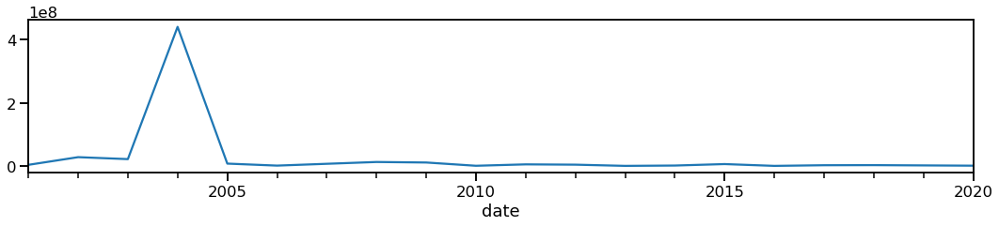

In [1707]:
pivot.Angola.plot(figsize=(18,3))

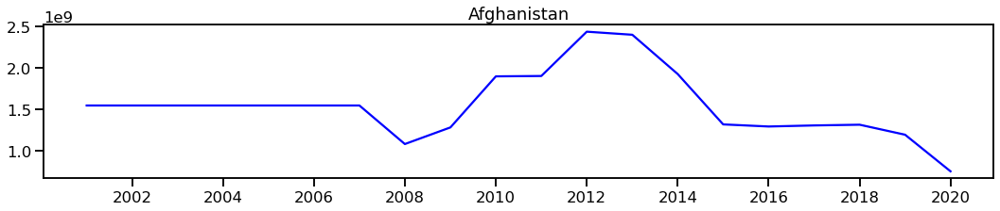

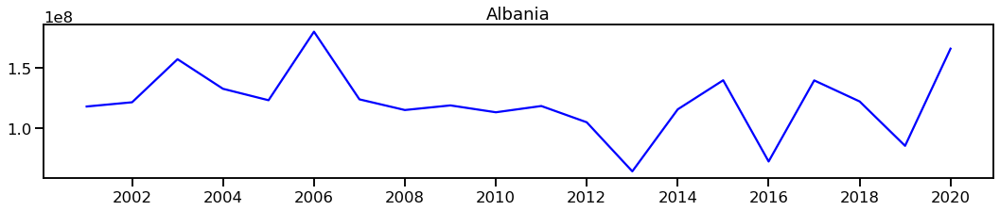

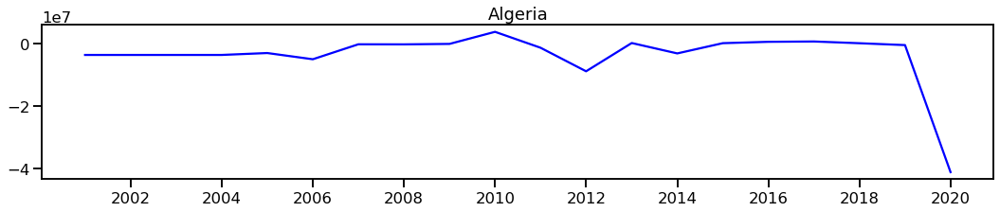

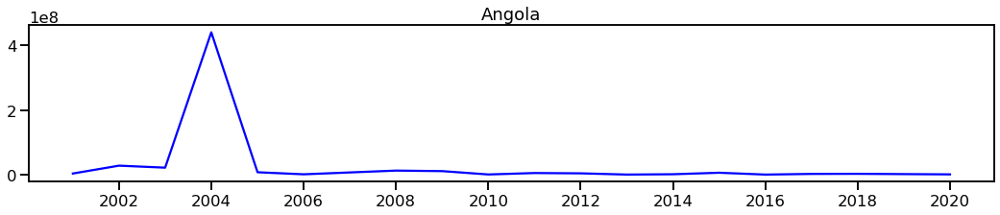

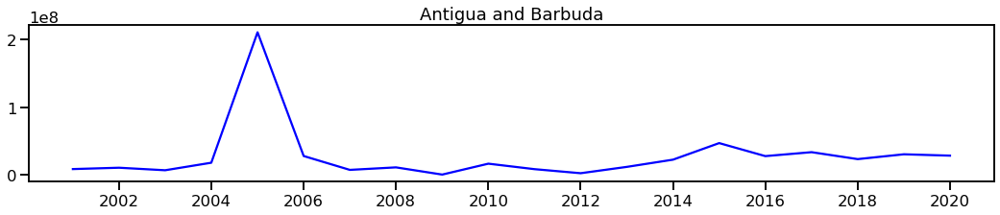

...

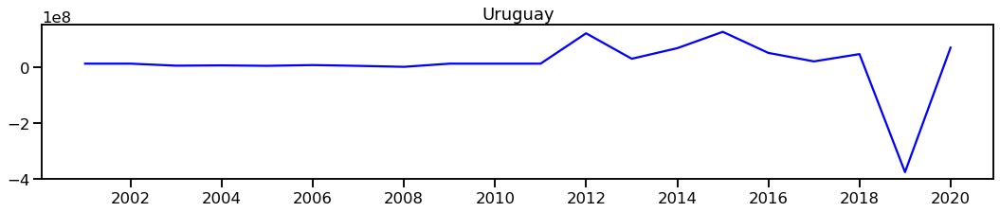

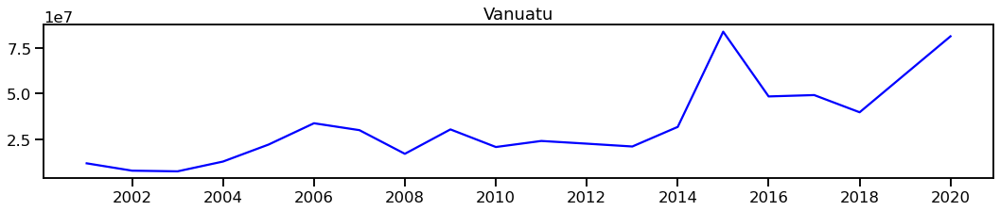

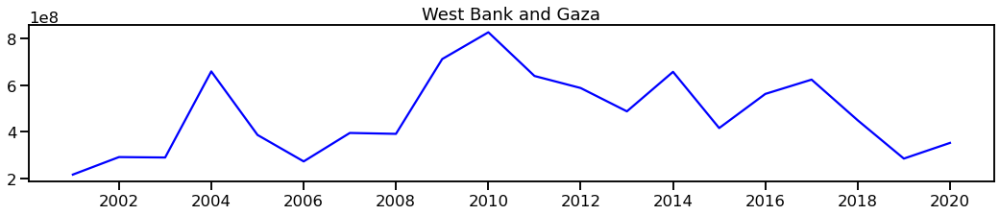

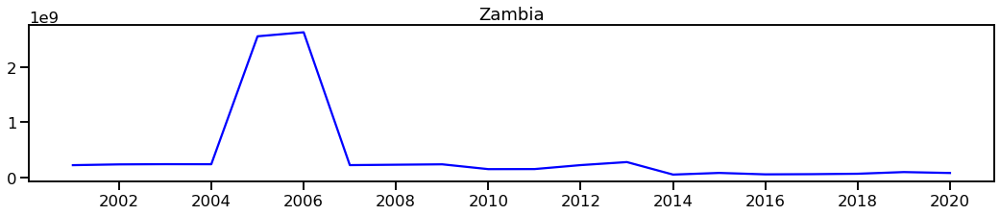

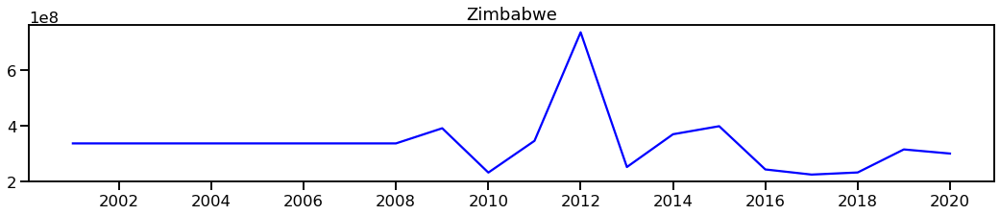

In [1708]:
country_name = pivot.columns

for i in range(len(country_name)):
    sns.set_context('talk')
    _ = plt.figure(figsize=(18,3))
    _ = plt.plot(pivot[country_name[i]], color='blue')
    _ = plt.title(country_name[i])
plt.show();

In [1712]:
# save as new csv

In [1713]:
# Net_amount = pivot.reset_index()
# Net_amount.to_csv('BoP_for_10_year.csv')

# give an estimate of the Net capital account for all countries for the next 5 years

In [1714]:
from statsmodels.tsa.arima_model import ARIMA

from sklearn.metrics import mean_squared_error
from math import sqrt

In [1715]:
import warnings
warnings.filterwarnings("ignore")
import datetime

In [1716]:
forecast_data = cleaned[['country_value', 'date', 'value']]
forecast_data.sort_values(by=['date', 'country_value'])

,country_value,date,value
999,Afghanistan,2001-01-01,1.545739e+09
1019,Albania,2001-01-01,1.177000e+08
1039,Algeria,2001-01-01,-3.613239e+06
1099,Angola,2001-01-01,3.890000e+06
1119,Antigua and Barbuda,2001-01-01,8.597407e+06
...,...,...,...
5120,Uruguay,2020-01-01,6.858008e+07
5160,Vanuatu,2020-01-01,8.134633e+07
5240,West Bank and Gaza,2020-01-01,3.519420e+08
5280,Zambia,2020-01-01,7.984156e+07


In [1717]:
X_train = forecast_data[forecast_data['date'] <= '2015-01-01']
X_valid = forecast_data[forecast_data['date']>= '2016-01-01']

print('X_train Shape', X_train.shape)
print('X_valid Shape', X_valid.shape)

X_train Shape (2610, 3)
X_valid Shape (870, 3)


In [1718]:
2436+1044

3480

In [1719]:
X_train[X_train['country_value']=='Nepal'].sort_values('date')

,country_value,date,value
3759,Nepal,2001-01-01,1.211322e+08
3758,Nepal,2002-01-01,1.024118e+08
3757,Nepal,2003-01-01,2.483206e+07
3756,Nepal,2004-01-01,1.566118e+07
3755,Nepal,2005-01-01,4.028209e+07
3754,Nepal,2006-01-01,4.631117e+07
3753,Nepal,2007-01-01,7.538814e+07
3752,Nepal,2008-01-01,1.135888e+08
3751,Nepal,2009-01-01,1.320021e+08
3750,Nepal,2010-01-01,1.851171e+08


In [1720]:
X_valid[X_valid['country_value']=='Nepal'].sort_values('date')

,country_value,date,value
3744,Nepal,2016-01-01,1.646316e+08
3743,Nepal,2017-01-01,1.490525e+08
3742,Nepal,2018-01-01,1.338928e+08
3741,Nepal,2019-01-01,1.421296e+08
3740,Nepal,2020-01-01,1.154403e+08


# Forecasting

## ARIMA

ARIMA:
- Uses a no. of lagged observation to forecast observations

Parameters: 
    - p: the no. of lag observations in the model, known as lag order(AR)
    - d: the no. of times that the raw observations are differenced, also known as the degree of differencing (I)
    - q: the size of the moving average window, also known as the order of the moving average(MA)

In [1770]:
X_train

,country_value,date,value
185,Euro area,2015-01-01,2.036089e+10
186,Euro area,2014-01-01,1.403393e+10
187,Euro area,2013-01-01,2.275907e+10
188,Euro area,2012-01-01,7.894049e+09
189,Euro area,2011-01-01,1.531817e+10
...,...,...,...
5315,Zimbabwe,2005-01-01,3.362943e+08
5316,Zimbabwe,2004-01-01,3.362943e+08
5317,Zimbabwe,2003-01-01,3.362943e+08
5318,Zimbabwe,2002-01-01,3.362943e+08


In [1771]:
np1 = forecast_data[forecast_data['country_value']=='Nepal'].sort_values('date')
np1_2 = np1.drop(columns= 'country_value').set_index('date')


In [1772]:
# Arima in country Nepal
npl = X_train[X_train['country_value']=='Nepal'].sort_values('date')


In [1773]:
np2 = npl[['date', 'value']].sort_values(by=['date'])
np2

,date,value
3759,2001-01-01,1.211322e+08
3758,2002-01-01,1.024118e+08
3757,2003-01-01,2.483206e+07
3756,2004-01-01,1.566118e+07
3755,2005-01-01,4.028209e+07
3754,2006-01-01,4.631117e+07
3753,2007-01-01,7.538814e+07
3752,2008-01-01,1.135888e+08
3751,2009-01-01,1.320021e+08
3750,2010-01-01,1.851171e+08


In [1774]:
# filtering the valid data
np_v = X_valid[X_valid['country_value']=='Nepal']
np_v2 = np_v[['date', 'value']]

In [1775]:
# set the date to the index
np2 = np2.set_index('date')
np_v2 = np_v2.set_index('date')

In [1776]:
np_v2

,value
date,
2020-01-01,1.154403e+08
2019-01-01,1.421296e+08
2018-01-01,1.338928e+08
2017-01-01,1.490525e+08
2016-01-01,1.646316e+08


In [1777]:
# Setting the Index for 5 years
index_6_years = pd.date_range(np_v2.index[-1], freq='AS', periods = 6)
index_6_years

DatetimeIndex(['2016-01-01', '2017-01-01', '2018-01-01', '2019-01-01',
               '2020-01-01', '2021-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')

In [1778]:
# Future
future_index_6_year = pd.date_range(np_v2.sort_values('date').index[-1], freq='AS', periods=6)
future_index_6_year

DatetimeIndex(['2020-01-01', '2021-01-01', '2022-01-01', '2023-01-01',
               '2024-01-01', '2025-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')

In [1779]:
# Auto-arima
import pmdarima as pm

In [1811]:
np1_2

,value
date,
2001-01-01,1.211322e+08
2002-01-01,1.024118e+08
2003-01-01,2.483206e+07
2004-01-01,1.566118e+07
2005-01-01,4.028209e+07
2006-01-01,4.631117e+07
2007-01-01,7.538814e+07
2008-01-01,1.135888e+08
2009-01-01,1.320021e+08


In [1781]:
# make a forecasts for validating
auto_arima_model = pm.auto_arima(np2, seasonal=False, m=2)
fcast1 = auto_arima_model.predict(6)
fcast1 = pd.Series(fcast1, index=index_6_years)
fcast1 = fcast1.rename("Auto ARIMA")

In [1782]:
# make a future forecast
auto_arima_model = pm.auto_arima(np1_2, seasonal=False, m=2)
fcast2 = auto_arima_model.predict(6)
fcast2 = pd.Series(fcast2, index=future_index_6_year)
fcast2 = fcast2.rename("Auto ARIMA Future")

In [1783]:
print(f'Validated forecast on known data:\n{fcast1[-5:]}')
print('=================================================')
print(f'Future forecast on unknown data:\n{fcast2[-5:]}')

Validated forecast on known data:
2017-01-01    1.540531e+08
2018-01-01    1.445048e+08
2019-01-01    1.361861e+08
2020-01-01    1.300230e+08
2021-01-01    1.259561e+08
Freq: AS-JAN, Name: Auto ARIMA, dtype: float64
Future forecast on unknown data:
2021-01-01    1.043996e+08
2022-01-01    1.069093e+08
2023-01-01    1.103545e+08
2024-01-01    1.134551e+08
2025-01-01    1.157767e+08
Freq: AS-JAN, Name: Auto ARIMA Future, dtype: float64


In [1784]:
# fcast2.plot(x='date', y='value')

<AxesSubplot:title={'center':'Nepal'}, xlabel='date', ylabel='value'>

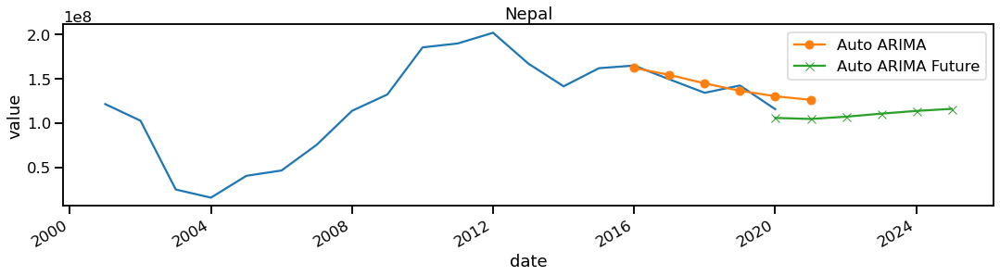

In [1785]:
# Plotting the predictions
fig, ax = plt.subplots(figsize=(18,4))
chart = sns.lineplot(x='date', y='value', data=np1_2)
chart.set_title("Nepal")
fcast1.plot(x='date', y='value', marker='o', legend=True)
fcast2.plot(x='date', y='value', marker='x', legend=True)


In [1786]:
# fcast1.plot(x='date', y='value')

In [1787]:
print(f'Actual values: {zm_v2.sort_values("date")}')
print('===============================================')
print(f'Validated Forecast values: \n{fcast1[-5:]}')
print('===============================================')
print(f'Future forecast on unknown data:\n{fcast2[-5:]}')

Actual values:                    value
date                    
2016-01-01  1.646316e+08
2017-01-01  1.490525e+08
2018-01-01  1.338928e+08
2019-01-01  1.421296e+08
2020-01-01  1.154403e+08
Validated Forecast values: 
2017-01-01    1.540531e+08
2018-01-01    1.445048e+08
2019-01-01    1.361861e+08
2020-01-01    1.300230e+08
2021-01-01    1.259561e+08
Freq: AS-JAN, Name: Auto ARIMA, dtype: float64
Future forecast on unknown data:
2021-01-01    1.043996e+08
2022-01-01    1.069093e+08
2023-01-01    1.103545e+08
2024-01-01    1.134551e+08
2025-01-01    1.157767e+08
Freq: AS-JAN, Name: Auto ARIMA Future, dtype: float64


In [1788]:
# printing theAI
print('The RMSE of auto-arima is:', mean_squared_error(zm_v['value'], fcast1[-5:], squared=False))

The RMSE of auto-arima is: 25922074.851139624


## Forecasting for France

In [1789]:
au1 = forecast_data[forecast_data['country_value']=='France'].sort_values('date')
au1_2= au1.drop(columns= 'country_value').set_index('date')

In [1790]:
au = X_train[X_train['country_value']=='France'].sort_values('date')

In [1791]:
au2 = au[['date', 'value']].sort_values(by=['date'])
au2

,date,value
2359,2001-01-01,1.784102e+08
2358,2002-01-01,4.450845e+08
2357,2003-01-01,-7.256008e+09
2356,2004-01-01,2.471485e+09
2355,2005-01-01,1.160867e+09
2354,2006-01-01,1.186005e+09
2353,2007-01-01,3.392506e+09
2352,2008-01-01,2.348350e+09
2351,2009-01-01,3.188621e+09
2350,2010-01-01,1.636125e+09


In [1792]:
# filtering the valid data
au_v = X_valid[X_valid['country_value']=='France']
au_v2 = au_v[['date', 'value']]
# au_v2

In [1793]:
# set the date to the index
au2 = au2.set_index('date')
au_v2 = au_v2.set_index('date')

In [1794]:
# Setting the Index for 5 years
index_6_years = pd.date_range(au2.index[-1], freq='AS', periods = 6)
index_6_years

DatetimeIndex(['2015-01-01', '2016-01-01', '2017-01-01', '2018-01-01',
               '2019-01-01', '2020-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')

In [1795]:
auto_arima_model = pm.auto_arima(au2, seasonal=False, m=7)
# make a forecasts on validation dataset
fcast1_au = auto_arima_model.predict(6)
fcast1_au = pd.Series(fcast1_au, index=index_6_years)
fcast1_au = fcast1_au.rename("Auto ARIMA")


In [1796]:
# make a future forecast
auto_arima_model = pm.auto_arima(au1_2, seasonal=False, m=2)
fcast2_au = auto_arima_model.predict(6)
fcast2_au = pd.Series(fcast2_au, index=future_index_6_year)
fcast2_au = fcast2.rename("Auto ARIMA Future")

In [1797]:
print(f'Validated forecast on known data:\n{fcast1_au[-5:]}')
print('=================================================')
print(f'Future forecast on unknown data:\n{fcast2_au[-5:]}')

Validated forecast on known data:
2016-01-01    1.005829e+09
2017-01-01    1.005829e+09
2018-01-01    1.005829e+09
2019-01-01    1.005829e+09
2020-01-01    1.005829e+09
Freq: AS-JAN, Name: Auto ARIMA, dtype: float64
Future forecast on unknown data:
2021-01-01    1.043996e+08
2022-01-01    1.069093e+08
2023-01-01    1.103545e+08
2024-01-01    1.134551e+08
2025-01-01    1.157767e+08
Freq: AS-JAN, Name: Auto ARIMA Future, dtype: float64


<AxesSubplot:title={'center':'France'}, xlabel='date', ylabel='value'>

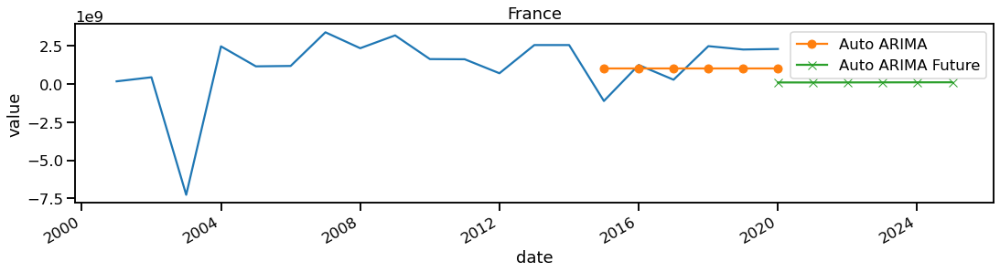

In [1798]:
# Plotting the predictions
fig, ax = plt.subplots(figsize=(18,4))
chart = sns.lineplot(x='date', y='value', data=au1)
chart.set_title("France")
fcast1_au.plot(ax = ax, x='date', y='value', legend=True, marker='o')
fcast2_au.plot(ax = ax, x='date', y='value', legend=True, marker='x')

In [1799]:
# fcast_au.plot(x='date', y='value')

In [1800]:
print(f'Actual values: {au_v2.sort_values("date")}')
print('===============================================')
print(f'Validated Forecast values on known data: \n{fcast1_au[-5:]}')
print('===============================================')
print(f'Future forecast on unknown data:\n{fcast2_au[-5:]}')


Actual values:                    value
date                    
2016-01-01  1.247761e+09
2017-01-01  2.848285e+08
2018-01-01  2.483684e+09
2019-01-01  2.263691e+09
2020-01-01  2.299529e+09
Validated Forecast values on known data: 
2016-01-01    1.005829e+09
2017-01-01    1.005829e+09
2018-01-01    1.005829e+09
2019-01-01    1.005829e+09
2020-01-01    1.005829e+09
Freq: AS-JAN, Name: Auto ARIMA, dtype: float64
Future forecast on unknown data:
2021-01-01    1.043996e+08
2022-01-01    1.069093e+08
2023-01-01    1.103545e+08
2024-01-01    1.134551e+08
2025-01-01    1.157767e+08
Freq: AS-JAN, Name: Auto ARIMA Future, dtype: float64


# For all countries

In [1801]:
X_train

,country_value,date,value
185,Euro area,2015-01-01,2.036089e+10
186,Euro area,2014-01-01,1.403393e+10
187,Euro area,2013-01-01,2.275907e+10
188,Euro area,2012-01-01,7.894049e+09
189,Euro area,2011-01-01,1.531817e+10
...,...,...,...
5315,Zimbabwe,2005-01-01,3.362943e+08
5316,Zimbabwe,2004-01-01,3.362943e+08
5317,Zimbabwe,2003-01-01,3.362943e+08
5318,Zimbabwe,2002-01-01,3.362943e+08


In [1802]:
import numpy as np

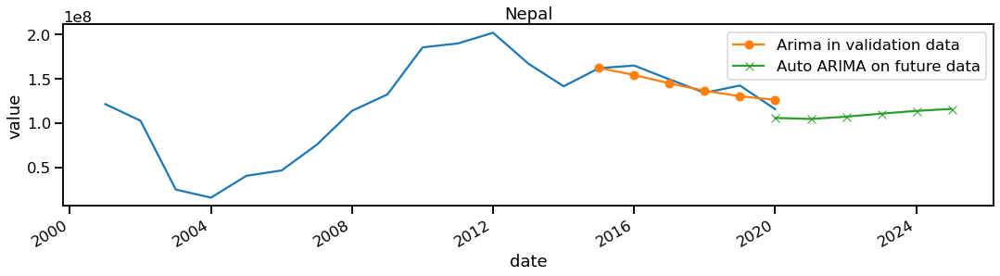

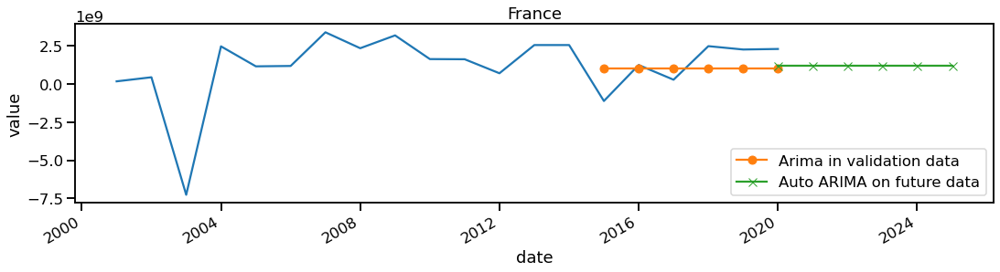

In [1824]:
# countries = forecast_data['country_value'].unique()
countries = ['Nepal', 'France']
fullcast=pd.DataFrame(columns=['date','Country', 'Arima ForecastValue Validation', 'Arima ForecastValue Future', 'MSE'])

for c in countries:    
    # this will be in plot to show validated data
    train = forecast_data[forecast_data['country_value']==c]
    # filtering data
    train_data = X_train[X_train['country_value']==c]
#     print(train_data)
    train_data2 = train_data[['date', 'value']].sort_values('date')
    
    # filtering validation data    
    valid_data = X_valid[X_valid['country_value']==c]
    valid_data2 = valid_data[['date', 'value']].sort_values('date')
    
    # all data
    all_data = forecast_data[forecast_data['country_value']==c]
    all_data2 = all_data[['date', 'value']].sort_values('date')
    
    # set index as date
    train_data2.set_index('date', inplace=True)
    valid_data2.set_index('date', inplace=True)
    valid_data2.columns=['Valid Data']
    all_data2.set_index('date', inplace=True)
    
    # setting Index validation
    index_6_years = pd.date_range(train_data2.index[-1], freq='AS', periods=6)
    
    # setting Index for forecast
    future_index_6_years = pd.date_range(valid_data2.index[-1], freq='AS', periods=6)
    
    try:
        # Modeling
        # make a forecasts on validation dataset

        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=2)
        fcast1 = auto_arima_model.predict(6)
        fcast1 = pd.Series(fcast1, index=index_6_years)
        fcast1 = fcast1.rename("Arima in validation data")
    except:
        print(c, "Auto Arima Train Error")
    
    try:
         # make a future forecast
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=2)
        fcast2 = auto_arima_model.predict(6)
        fcast2 = pd.Series(fcast2, index=future_index_6_year)
        fcast2 = fcast2.rename("Auto ARIMA on future data")
    except:
        print(c, "Auto Arima Future Train Error")
        
        ########### Plot ###########
        
    fig, ax = plt.subplots(figsize=(18,4))
    chart = sns.lineplot(x='date', y='value', data=train)
    chart.set_title(c)
    fcast1.plot(ax = ax, x='date', y='value', legend=True, marker='o')
    fcast2.plot(ax = ax, x='date', y='value', legend=True, marker='x')
    
        ########### Saving MSE ###########
    fcast_mse = mean_squared_error(valid_data['value'], fcast1_au[-5:], squared=False)

    
        ########### Saving the result ###########
    # creating a DF for fcast
    fcast1 = fcast1.reset_index()
    fcast1.columns = ['date', 'Arima ForecastValue Validation']

    fcast2 = fcast2.reset_index()
    fcast2.columns = ['date', 'Arima ForecastValue Future']


    # adding new columns
    fcast1['Arima ForecastValue Future'] = np.nan
    fcast2['Arima ForecastValue Validation'] = np.nan

    # reordering columns order
#     fcast1 = fcast1[['date', 'Arima ForecastValue Future','Arima FutureValue Validation']]

    # joining
    df_fcast1 = pd.concat([fcast1,fcast2], axis=0)
    df_fcast1['Country'] = c
    df_fcast1['MSE'] = fcast_mse
    
    # final data
    df_fcast1 = df_fcast1.groupby(['date', 'Country'],as_index=False).agg({'Arima ForecastValue Validation':'sum',
                                                                           'Arima ForecastValue Future':'sum',
                                                                          'MSE':'max'})
    fullcast = fullcast.append(df_fcast1, ignore_index=True)
    

In [1804]:
# df_fcast1 = df_fcast1.groupby(['date', 'Country'],as_index=False).agg({'Arima ForecastValue Validation':'sum', 'Arima ForecastValue Future':'sum'})

In [1826]:
df_fcast1.head()

,date,Country,Arima ForecastValue Validation,Arima ForecastValue Future,MSE
0,2015-01-01,Zimbabwe,1.005829e+09,0.0,7.444395e+08
1,2016-01-01,Zimbabwe,1.005829e+09,0.0,7.444395e+08
2,2017-01-01,Zimbabwe,1.005829e+09,0.0,7.444395e+08
3,2018-01-01,Zimbabwe,1.005829e+09,0.0,7.444395e+08
4,2019-01-01,Zimbabwe,1.005829e+09,0.0,7.444395e+08


In [1827]:
fullcast.head()

,date,Country,Arima ForecastValue Validation,Arima ForecastValue Future,MSE
0,2015-01-01 00:00:00,Euro area,1005829227.37279,0.0,25130108332.752449
1,2016-01-01 00:00:00,Euro area,1005829227.37279,0.0,25130108332.752449
2,2017-01-01 00:00:00,Euro area,1005829227.37279,0.0,25130108332.752449
3,2018-01-01 00:00:00,Euro area,1005829227.37279,0.0,25130108332.752449
4,2019-01-01 00:00:00,Euro area,1005829227.37279,0.0,25130108332.752449


# For All Country

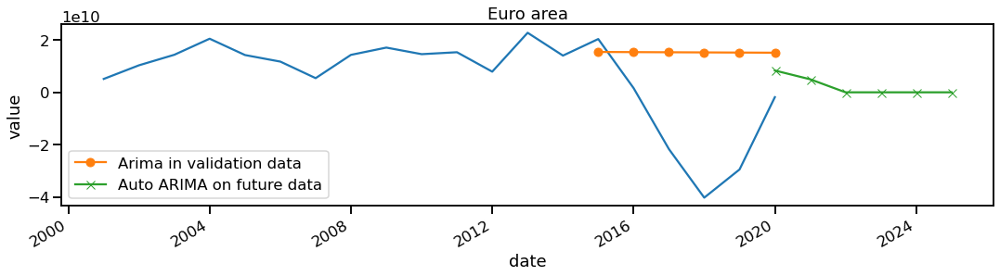

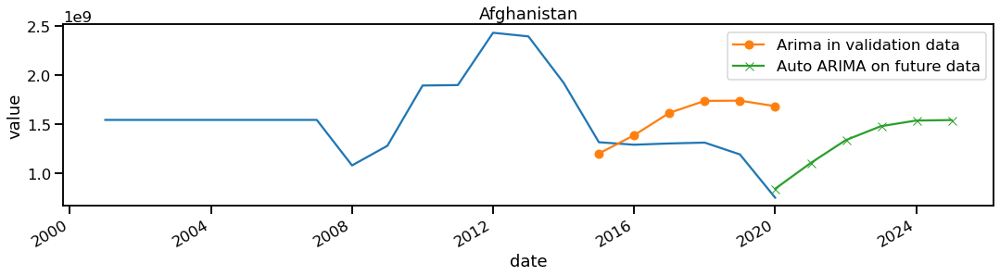

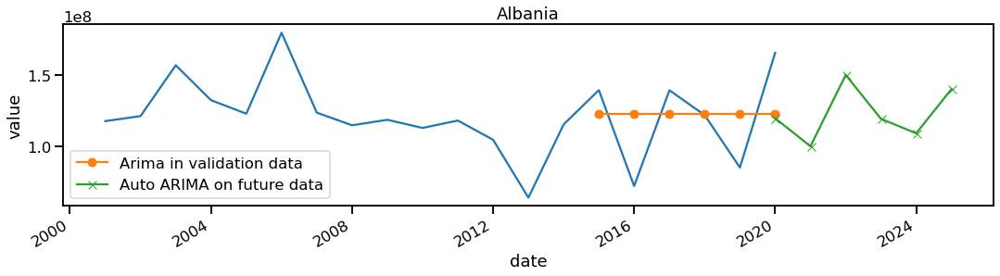

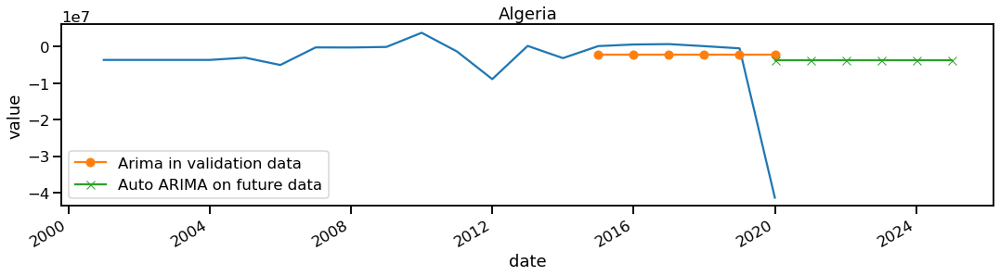

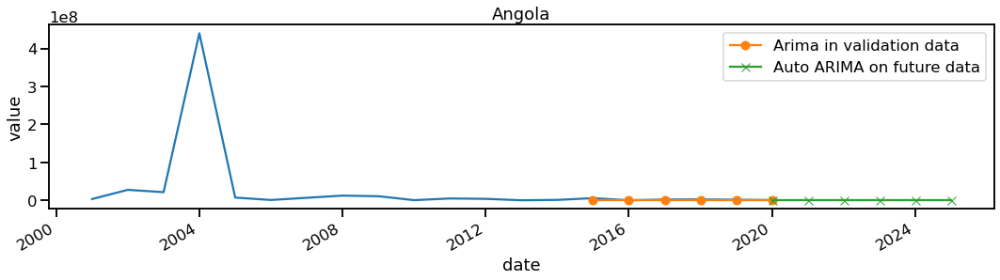

...

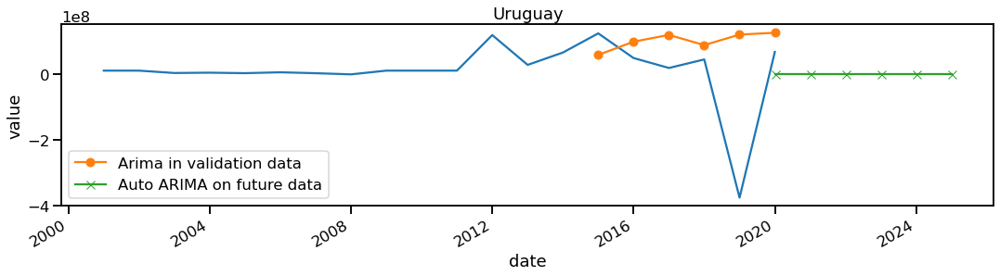

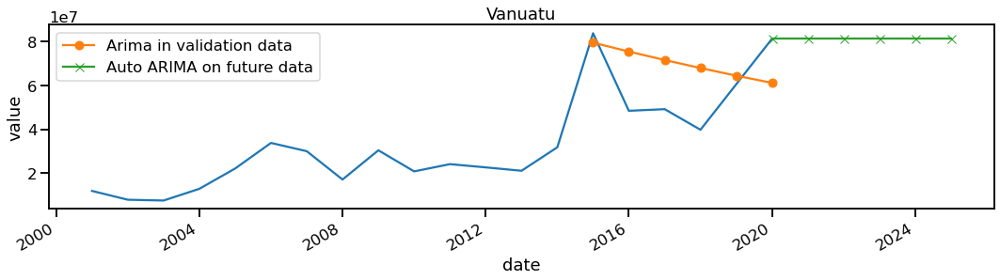

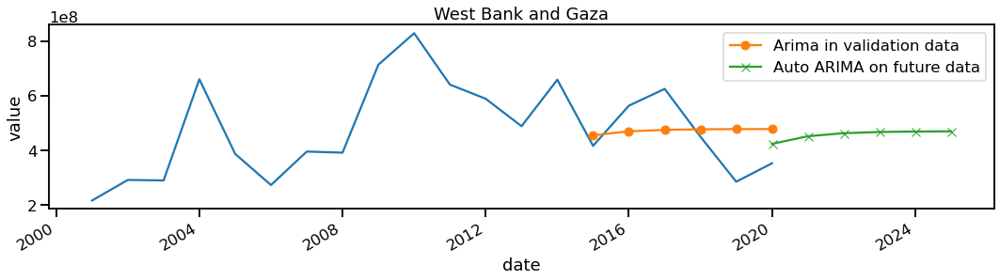

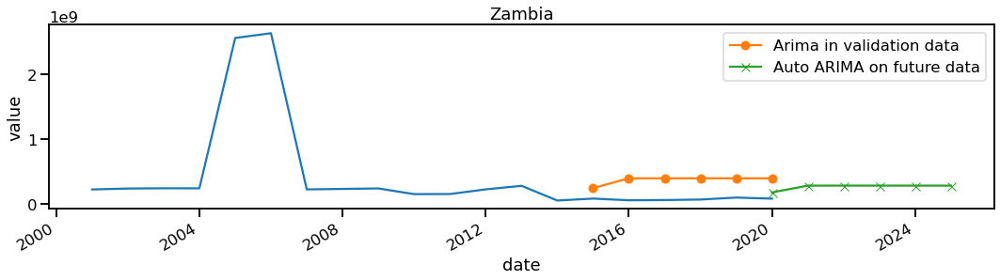

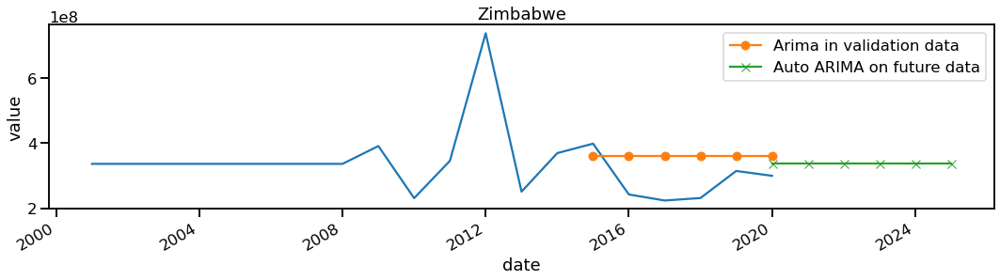

In [1828]:
countries = forecast_data['country_value'].unique()
# countries = ['France', 'Nepal', 'Zambia']

fullcast=pd.DataFrame(columns=['date','Country', 'Arima ForecastValue Validation', 'Arima ForecastValue Future', 'MSE'])

for c in countries:    
    # this will be in plot to show validated data
    train = forecast_data[forecast_data['country_value']==c]
    # filtering data
    train_data = X_train[X_train['country_value']==c]
#     print(train_data)
    train_data2 = train_data[['date', 'value']].sort_values('date')
    
    # filtering validation data    
    valid_data = X_valid[X_valid['country_value']==c]
    valid_data2 = valid_data[['date', 'value']].sort_values('date')
    
    # all data
    all_data = forecast_data[forecast_data['country_value']==c]
    all_data2 = all_data[['date', 'value']].sort_values('date')
    
    # set index as date
    train_data2.set_index('date', inplace=True)
#     print(train_data2)
    valid_data2.set_index('date', inplace=True)
    valid_data2.columns=['Valid Data']
    all_data2.set_index('date', inplace=True)
    
    # setting Index validation
    index_6_years = pd.date_range(train_data2.index[-1], freq='AS', periods=6)
    
    # setting Index for forecast
    future_index_6_years = pd.date_range(valid_data2.index[-1], freq='AS', periods=6)
    
    try:
        # Modeling
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)
        # make a forecasts on validation dataset
        fcast1 = auto_arima_model.predict(6)
        fcast1 = pd.Series(fcast1, index=index_6_years)
        fcast1 = fcast1.rename("Arima in validation data")
    except:
        print(c, "Auto Arima Train Error")
    
    try:
         # make a future forecast
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=2)
        fcast2 = auto_arima_model.predict(6)
        fcast2 = pd.Series(fcast2, index=future_index_6_year)
        fcast2 = fcast2.rename("Auto ARIMA on future data")
    except:
        print(c, "Auto Arima Future Train Error")
        
        ########### Plot ###########
        
    fig, ax = plt.subplots(figsize=(18,4))
    chart = sns.lineplot(x='date', y='value', data=train)
    chart.set_title(c)
    fcast1.plot(ax = ax, x='date', y='value', legend=True, marker='o')
    fcast2.plot(ax = ax, x='date', y='value', legend=True, marker='x')
    
        ########### Saving MSE ###########
    fcast_mse = mean_squared_error(valid_data['value'], fcast1_au[-5:], squared=False)

    
        ########### Saving the result ###########
    # creating a DF for fcast
    fcast1 = fcast1.reset_index()
    fcast1.columns = ['date', 'Arima ForecastValue Validation']

    fcast2 = fcast2.reset_index()
    fcast2.columns = ['date', 'Arima ForecastValue Future']


    # adding new columns
    fcast1['Arima ForecastValue Future'] = np.nan
    fcast2['Arima ForecastValue Validation'] = np.nan

    # reordering columns order
#     fcast1 = fcast1[['date', 'Arima ForecastValue Future','Arima FutureValue Validation']]

    # joining
    df_fcast1 = pd.concat([fcast1,fcast2], axis=0)
    df_fcast1['Country'] = c
    df_fcast1['MSE'] = fcast_mse
    
    # final data
    df_fcast1 = df_fcast1.groupby(['date', 'Country'],as_index=False).agg({'Arima ForecastValue Validation':'sum',
                                                                           'Arima ForecastValue Future':'sum',
                                                                          'MSE':'max'})
    fullcast = fullcast.append(df_fcast1, ignore_index=True)


# Saving Result of Forecast to visualize in Power BI

In [1829]:
# Union prediction with the original dataset
forecast_data['Arima ForecastValue Validation'] = np.nan
forecast_data['Arima ForecastValue Future'] = np.nan
forecast_data['MSE'] = np.nan
fullcast['value'] = np.nan
forecast_data.shape

(3480, 6)

In [1830]:
# Reorder
fullcast = fullcast[['Country', 'date','value','Arima ForecastValue Validation', 'Arima ForecastValue Future', 'MSE']]
fullcast.shape

(1914, 6)

In [1831]:
# Union
output_df = pd.concat([fullcast,forecast_data], axis=0)
output_df

,Country,date,value,Arima ForecastValue Validation,Arima ForecastValue Future,MSE,country_value
0,Euro area,2015-01-01 00:00:00,NaN,15426442977.239765,0.0,25130108332.752449,NaN
1,Euro area,2016-01-01 00:00:00,NaN,15367657773.618069,0.0,25130108332.752449,NaN
2,Euro area,2017-01-01 00:00:00,NaN,15309096581.466154,0.0,25130108332.752449,NaN
3,Euro area,2018-01-01 00:00:00,NaN,15250758547.148489,0.0,25130108332.752449,NaN
4,Euro area,2019-01-01 00:00:00,NaN,15192642820.282471,0.0,25130108332.752449,NaN
...,...,...,...,...,...,...,...
5315,NaN,2005-01-01 00:00:00,3.362943e+08,NaN,NaN,NaN,Zimbabwe
5316,NaN,2004-01-01 00:00:00,3.362943e+08,NaN,NaN,NaN,Zimbabwe
5317,NaN,2003-01-01 00:00:00,3.362943e+08,NaN,NaN,NaN,Zimbabwe
5318,NaN,2002-01-01 00:00:00,3.362943e+08,NaN,NaN,NaN,Zimbabwe


In [1832]:
output_df.to_csv('Forecast.csv')